Enter the absolute path to your video_pose directory:C:\Users\Zach\Documents\McGill\Fall 2022\ECSE 458\video_pose
Enter the video pose type (0: No penalty; 1: Slashing; 2: Tripping):0
Enter the video name:_2017-11-05-det-edm-national15
Chose type No_penalty
C:\Users\Zach\Documents\McGill\Fall 2022\ECSE 458\video_pose/No_penalty/_2017-11-05-det-edm-national15


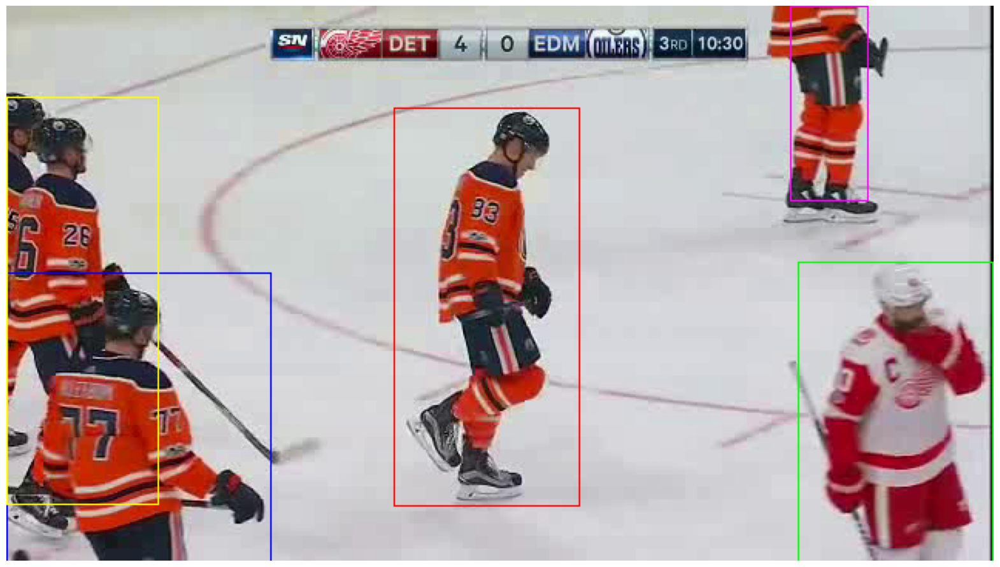

Press enter to view next frame, or q to quit



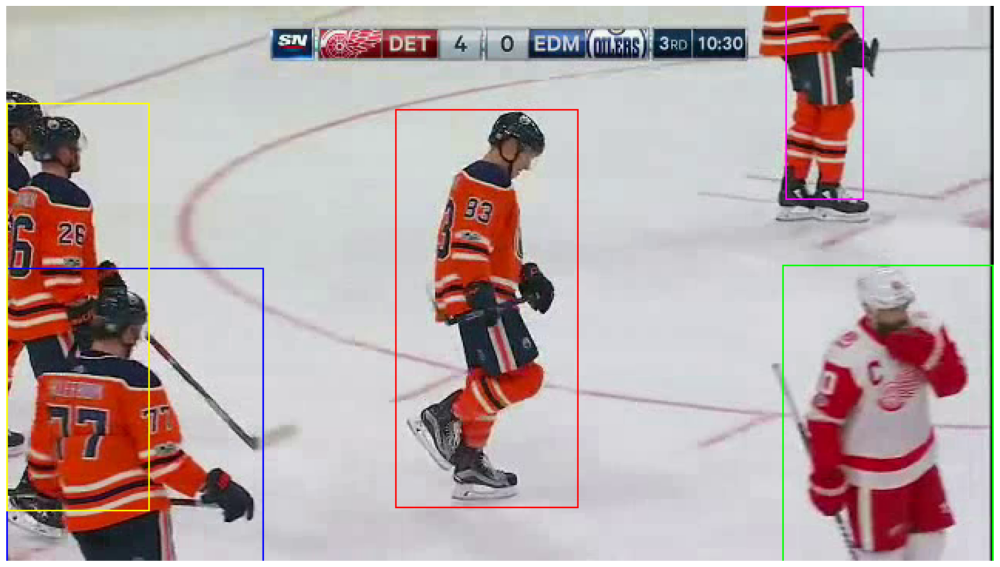

Press enter to view next frame, or q to quit



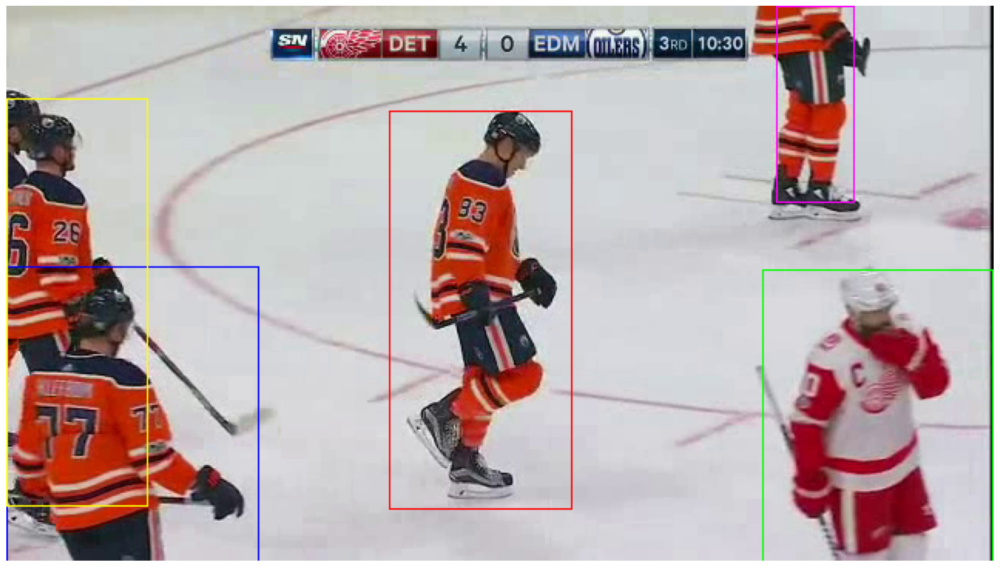

Press enter to view next frame, or q to quit



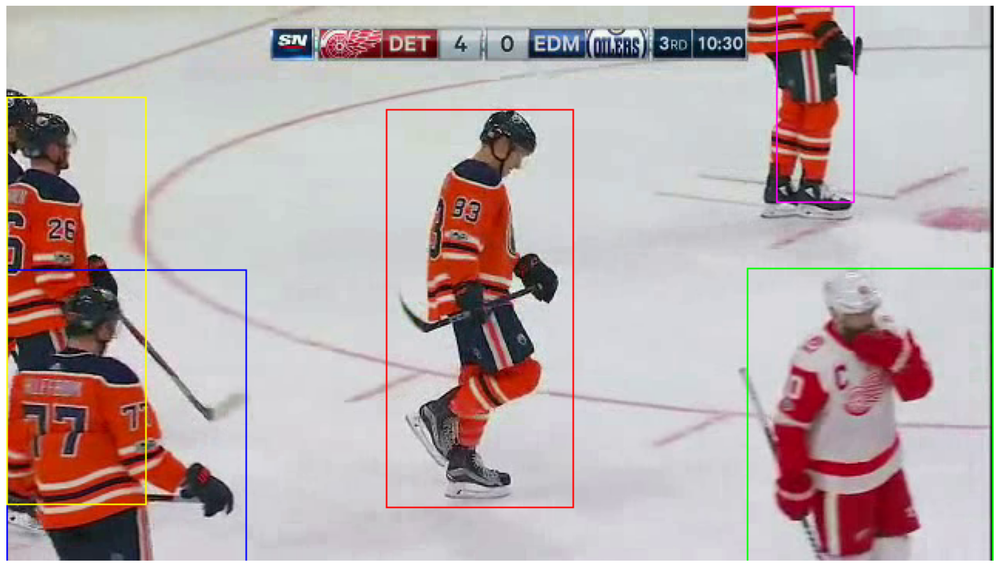

Press enter to view next frame, or q to quit



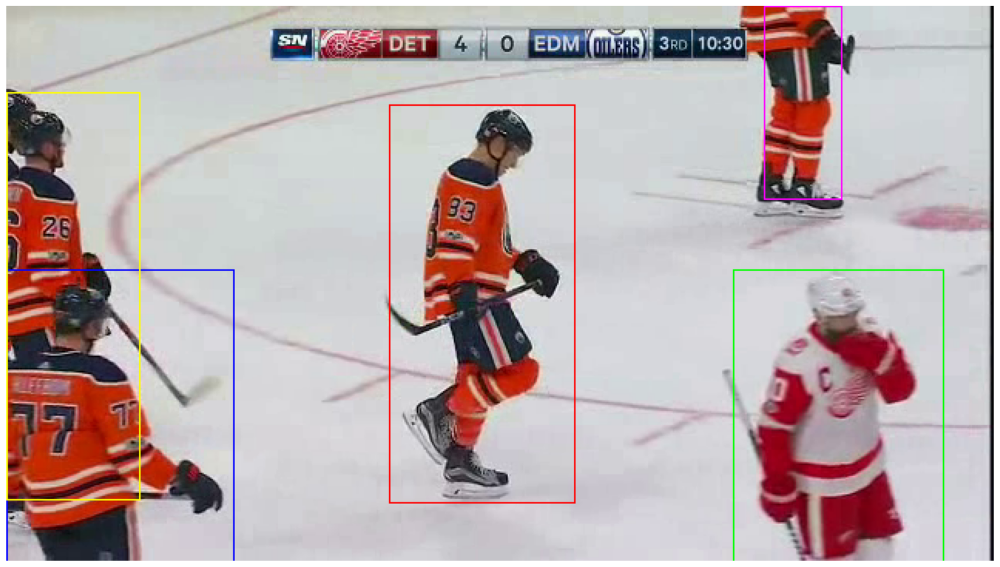

Press enter to view next frame, or q to quit



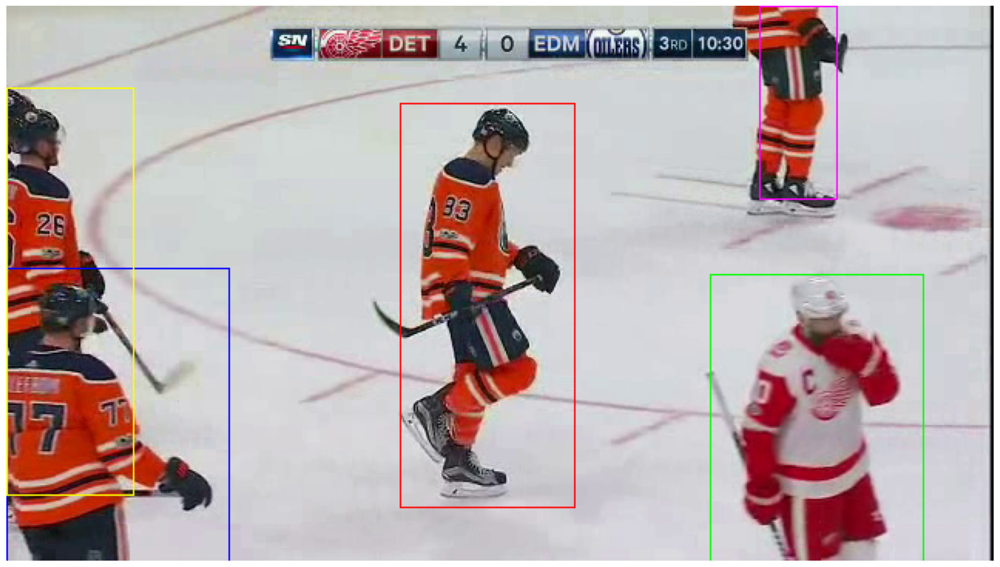

Press enter to view next frame, or q to quit



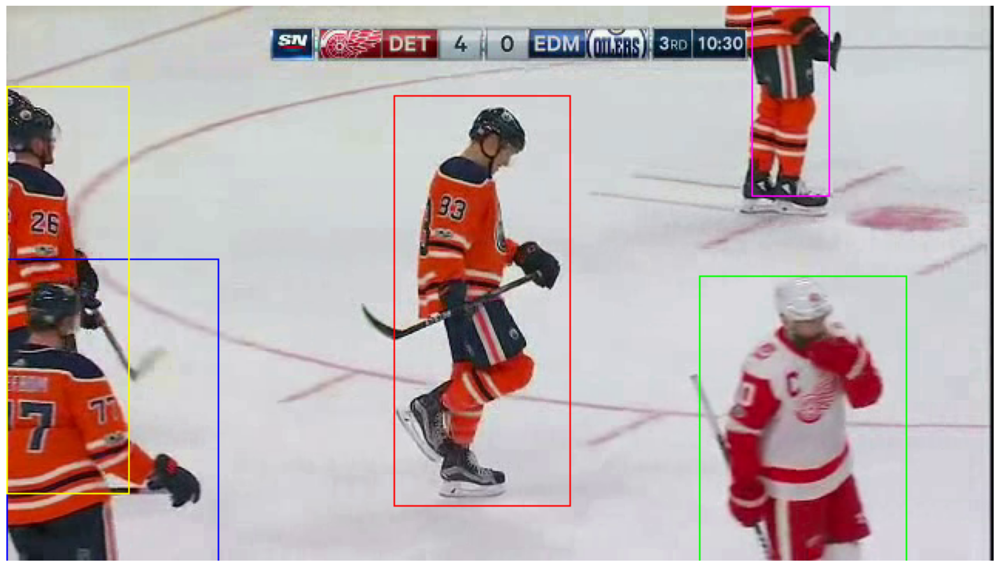

Press enter to view next frame, or q to quit



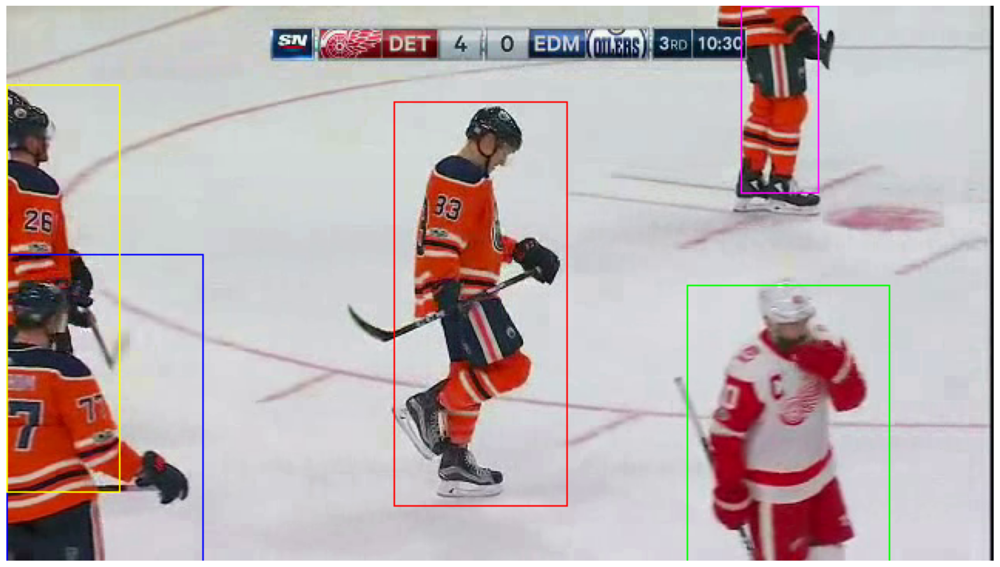

Press enter to view next frame, or q to quit



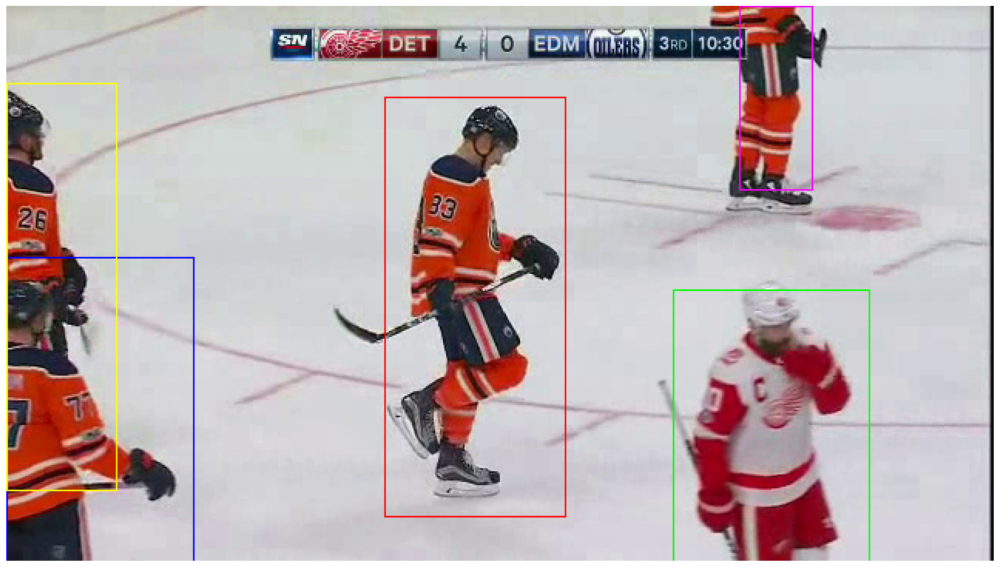

Press enter to view next frame, or q to quit



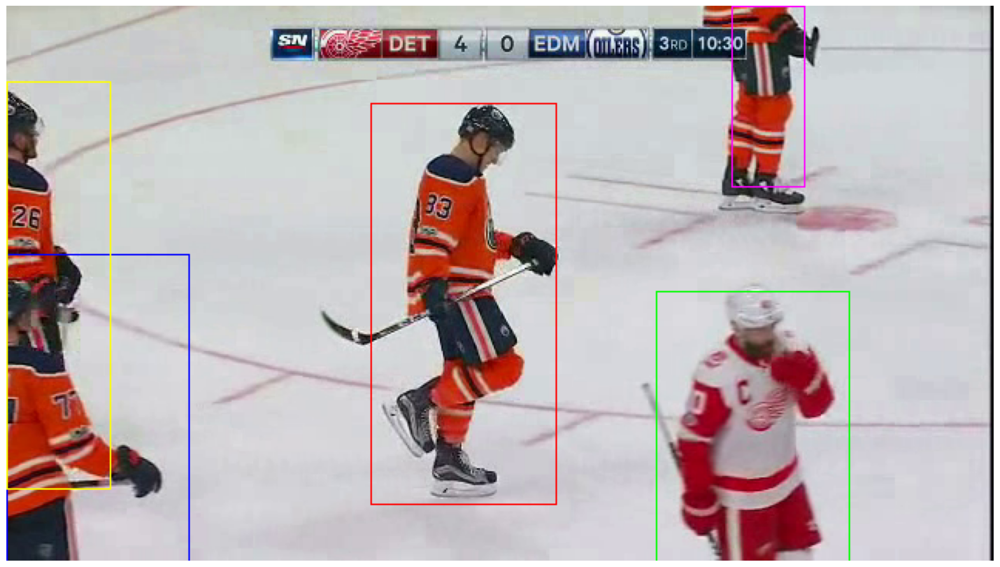

Press enter to view next frame, or q to quit



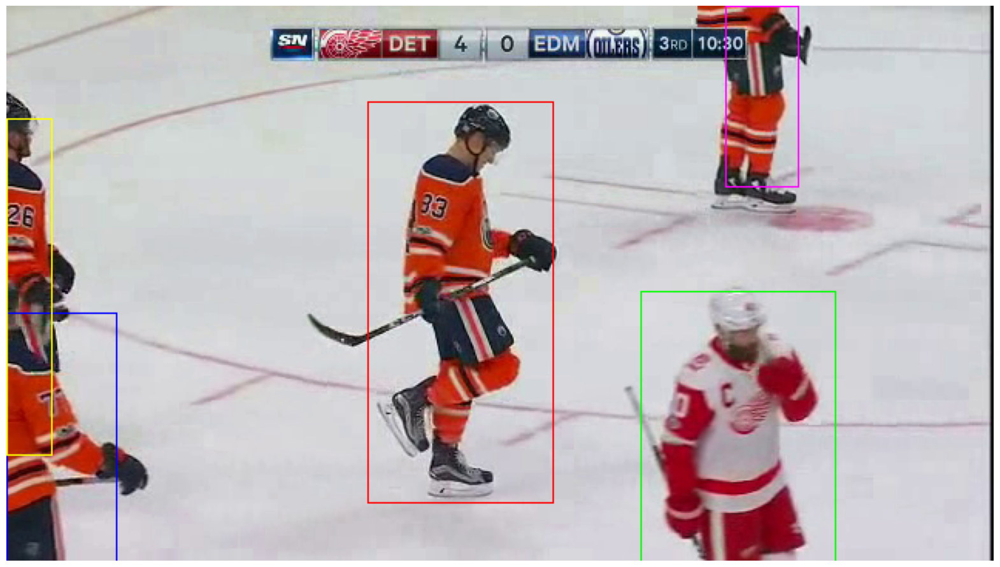

KeyboardInterrupt: Interrupted by user

In [4]:
import json
import cv2
import matplotlib.pyplot as plt
import matplotlib.image as im 

PATH_TO_VIDEOPOSE = input("Enter the absolute path to your video_pose directory:")
VIDEO_POSE_TYPE = input("Enter the video pose type (0: No penalty; 1: Slashing; 2: Tripping):")
VIDEO_NAME = input("Enter the video name:")
VIDEO_POSE_TYPES = {"0": "No_penalty", "1": "Slashing", "2": "Tripping"}
PLAYER_COLORS = {1: (255,0,0), 2: (0,255,0), 3: (0,0,255), 4: (255,255,0), 5: (255,0,255), 6: (0,255,255), 7: (0,0,0)}

print(f'Chose type {VIDEO_POSE_TYPES.get(VIDEO_POSE_TYPE)}')
video_folder_path = PATH_TO_VIDEOPOSE + "/" + VIDEO_POSE_TYPES.get(VIDEO_POSE_TYPE) + "/" + VIDEO_NAME
bbox_filename = video_folder_path + "/" + VIDEO_NAME + "-bbox-only.json"
print(video_folder_path)

f = open(bbox_filename)
data = json.load(f)
f.close()

curImageNumber = 0
while True :
    #draw the current image
    img_path = video_folder_path + "/img_" + str(curImageNumber).zfill(4) +".png"
    img = cv2.cvtColor(cv2.imread(img_path, 1), cv2.COLOR_BGR2RGB)
    # create a figure to add images as subplots
    fig = plt.figure(figsize=(20, 20))
    foundBox = False
    for box in data :
        if box["image_id"] == curImageNumber:
            #draw rectangles related to this image
            foundBox = True
            left = int(box["bbox"][0])
            top = int(box["bbox"][1])
            right = int(left + box["bbox"][2])
            bottom = int(top + box["bbox"][3])
            color = PLAYER_COLORS.get(box["category_id"]) if box["category_id"] <= 7 else (255,255,255)

            cv2.rectangle(img, (left, top), (right, bottom), color,1)
            #cv2.rectangle(img, (251, 66), (371, 324), (0,255,0),1)
    if foundBox == False:
        #If no image with this frame number was found, return to frame 1.
        print("Frame number to high. Returning to frame 1.")
        curImageNumber = 1
        continue
    plt.imshow(img)
    plt.axis('off')
    plt.show(block = False)
    curImageNumber += 1
    txt = input("Press enter to view next frame, a number to jump to that frame number, or q to quit")
    if txt == "q":
        break
    if txt.isdigit():
        curImageNumber = int(txt)
    print("\r\r")